# GitHub

Ссылка со всеми материалами с лекций и семинаров: https://github.com/ml-dafe/ml_mipt_dafe/tree/main

Для скачивания репозитория и подгрузки изменений из него вы можете выбрать удобный для вас способ:
- GitHub Desktop: https://desktop.github.com/download/
- Работа с GitHub через Git: https://gitforwindows.org/

Перед каждым семинаром рекомендуем загружать изменения заранее, а также проверять все ли необходимые библиотеки для работы у вас установлены.

# Визуализация в Python

## Matplotlib

__Matplotlib__ - это отличная библиотека 2D и 3D графики для создания научных рисунков. Одной из ключевых особенностей Matplotlib является то, что всеми аспектами рисунка можно управлять программно. Это важно для воспроизводимости и удобно, когда нужно восстановить рисунок с обновленными данными или изменить его внешний вид.

Подробнее с Matplotlib можете ознакомиться на официальном сайте: https://matplotlib.org/

Подробный гайд по визуализации в Matplotlib: https://nbviewer.org/github/jrjohansson/scientific-python-lectures/blob/master/Lecture-4-Matplotlib.ipynb

In [32]:
!pip install matplotlib

После установки перезапустите Kernel

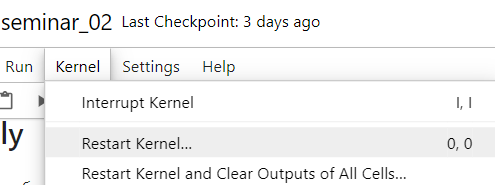

In [21]:
import numpy as np
import matplotlib.pyplot as plt

Рассмотрим способы размещения графиков в Matplotlib на примере [plt.scatter](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html) и [plt.plot](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html)

## Работа с несколькими графиками

In [17]:
# зададим квадратичную зависимость
x = np.linspace(0, 5, 10)
y = x ** 2

Для построение нескольких графиков есть инстурмент [plt.subplot](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplot.html), который принимает три числа int, которые описывают количество строк, количество столбцов и индекс, по которому сейчас необходимо отобразить график. Индекс начинается с 1 в верхнем левом углу и увеличивается вправо и вниз.

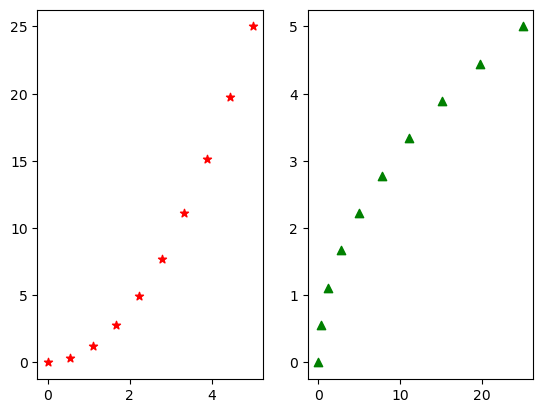

In [41]:
plt.subplot(1, 2, 1) # всего 1 строка, 2 столбца, график отображать на левом графике
plt.scatter(x, y, color='r', marker='*')

plt.subplot(1, 2, 2) # всего 1 строка, 2 столбца, график отображать на правом графике
plt.scatter(y, x, color='g', marker='^')

Помимо выше указанного есть метод [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html). Данный метод возвращает объект Figure и объект Axes, в котором храняться оси, в которых будут отображаться графики. Индексы созданных осей увеличиваются также, начиная слева вверху и увеличиваясь вправо и вниз.

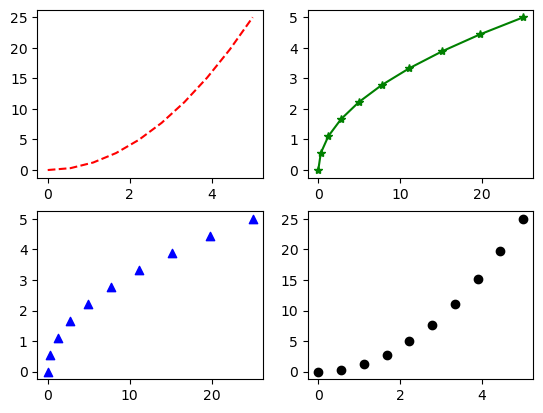

In [73]:
fig, axes = plt.subplots(nrows=2, ncols=2)

axes[0][0].plot(x, y, 'r--')
axes[0][1].plot(y, x, 'g*-')
axes[1][0].scatter(y, x, c='blue', marker='^')
axes[1][1].scatter(x, y, color='black')

Ещё один способ задать несколько осей на одном графике с помощью [plt.subplot2grid](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplot2grid.html)

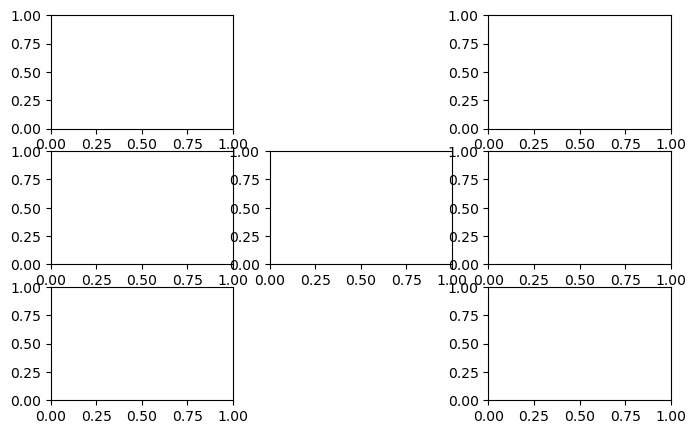

In [72]:
fig = plt.figure(figsize=(8, 5)) # initialize figure

ax = [None for _ in range(7)] # list to save many ax for setting parameter in each

ax[0] = plt.subplot2grid((3,3), (0,0))
ax[1] = plt.subplot2grid((3,3), (0,2))
ax[2] = plt.subplot2grid((3,3), (1,0))
ax[3] = plt.subplot2grid((3,3), (1,1))
ax[4] = plt.subplot2grid((3,3), (1,2))
ax[5] = plt.subplot2grid((3,3), (2,0))
ax[6] = plt.subplot2grid((3,3), (2,2))

# plt.tight_layout()

Оси можно добавлять по мере их надобности, а не сразу задавать количество строк и столбцов. Делается это с помощью метода [add_axes](https://matplotlib.org/stable/api/_as_gen/matplotlib.figure.Figure.add_axes.html), которому передаются координаты верхнего левого и нижнего правого углов в относительных координатах от 0 до 1.

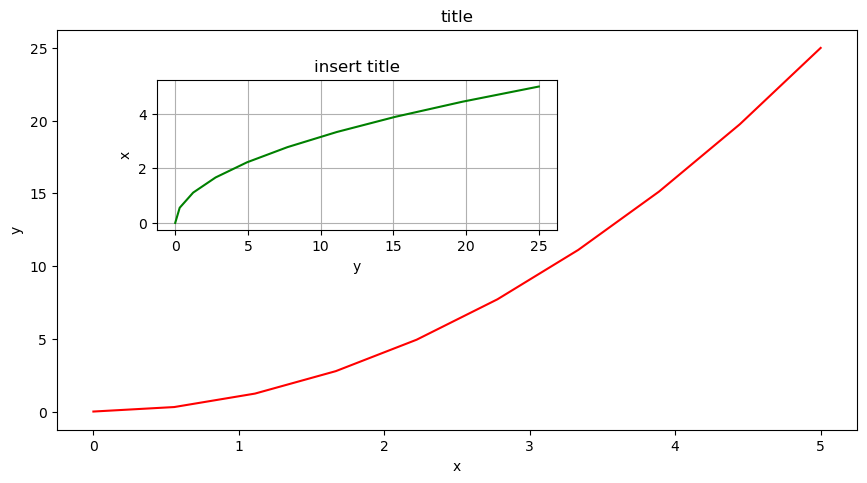

In [51]:
fig = plt.figure(figsize=(10, 5))

axes1 = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # main axes
axes2 = fig.add_axes([0.2, 0.5, 0.4, 0.3]) # inset axes

# main figure
axes1.plot(x, y, 'r')
axes1.set_xlabel('x')
axes1.set_ylabel('y')
axes1.set_title('title')

# insert
axes2.plot(y, x, 'g')
axes2.set_xlabel('y')
axes2.set_ylabel('x')
axes2.set_title('insert title')
axes2.grid()

plt.savefig('plots.jpg')

__Задание 1__: Создайте шаблон осей, как представлено ниже на рисунке. В каждой оси постройте любой график, заданный функцией, точечный или линейный. Для любых двух осей добавьте сетку. Оси подпишите своими именем и фамилией. Сохраните график и отправьте его в чат.

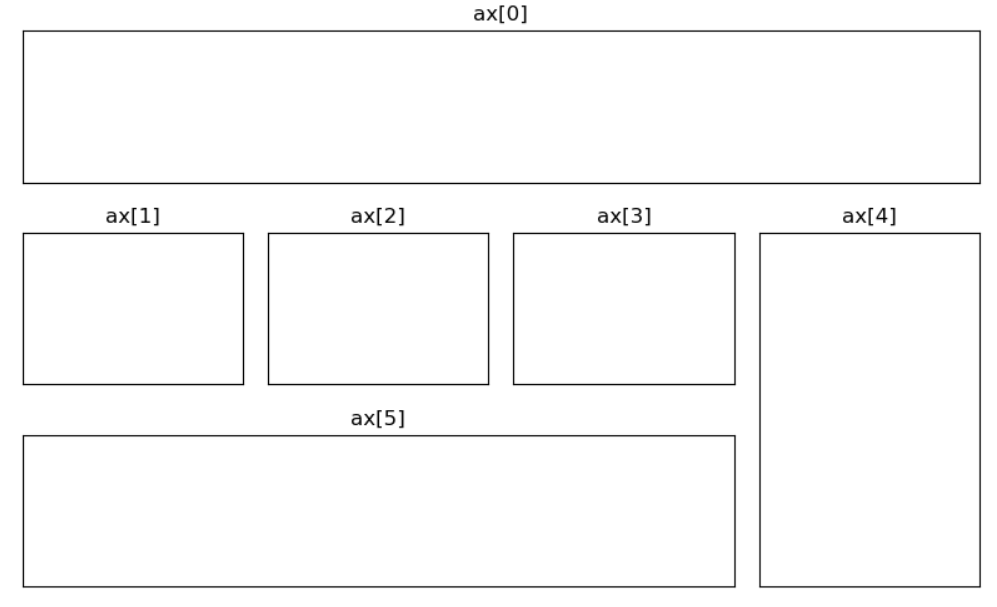

*Дополнительно*: Можете самостоятельно найти и сделать сетку более мелкой.

In [ ]:
# YOUR CODE HERE

## Работа с осями

Рассмотрим пример, когда нам нужно построить график в декартовой системе координат

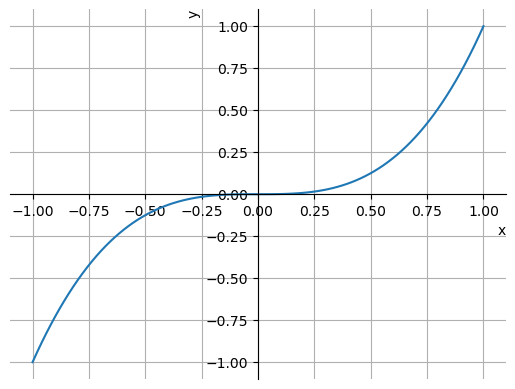

In [15]:
fig, ax = plt.subplots()

# обычно в осях есть границы со всех сторон, сначала нам нужно убрать границы сверху и справа
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

# затем закрепить положение в 0 для осей x и y
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('data',0)) # set position of x spine to x=0

ax.yaxis.set_ticks_position('left')
ax.spines['left'].set_position(('data',0))   # set position of y spine to y=0

# подпишем оси
ax.set_xlabel("x", loc='right')
ax.set_ylabel("y", loc='top')

# нарисуем график
xx = np.linspace(-1., 1., 100)
ax.plot(xx, xx**3)
ax.grid()

Возможно, мы захотим настроить диапазоны осей. Мы можем сделать это, используя методы [set_ylim](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_ylim.html) и [set_xlim](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xlim.html) в объекте axis или axis("tight") для автоматического получения "плотно подогнанных" диапазонов осей

Text(0.5, 1.0, 'custom axes range')

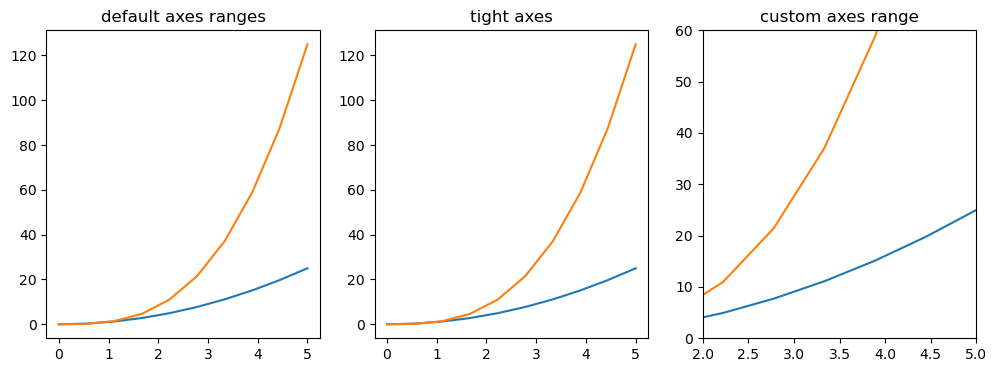

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].plot(x, x**2, x, x**3) # способ рисовать два графика в одних осях
axes[0].set_title("default axes ranges")

axes[1].plot(x, x**2, x, x**3) 
axes[1].axis('tight')
axes[1].set_title("tight axes")

axes[2].plot(x, x**2, x, x**3)
axes[2].set_ylim([0, 60])
axes[2].set_xlim([2, 5])
axes[2].set_title("custom axes range")

Также можно задать логарифмический масштаб для одной или обеих осей. На самом деле эта функциональность является лишь одним из приложений более общей системы преобразования в Matplotlib. Масштаб каждой из осей устанавливается отдельно с помощью методов [set_xscale](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xscale.html) и [set_yscale](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_yscale.html), которые принимают один параметр (в данном случае со значением "log").

Text(0.5, 1.0, 'Logarithmic scale (y)')

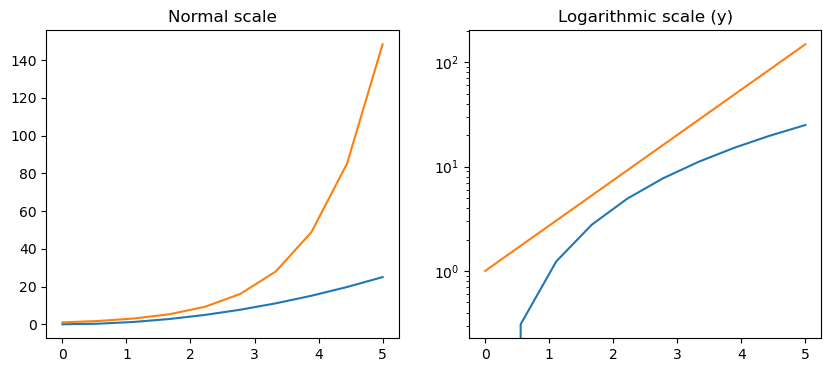

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

axes[0].plot(x, x**2, x, np.exp(x))
axes[0].set_title("Normal scale")

axes[1].plot(x, x**2, x, np.exp(x))
axes[1].set_yscale("log") # с помощью данного метода задаём сетку по оси y
axes[1].set_title("Logarithmic scale (y)")

Мы можем явно определить, где мы хотим разместить отметки на оси, с помощью [set_xticks](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xticks.html) и [set_yticks](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_yticks.html), которые оба принимают список значений для того, где на оси должны быть размещены отметки. Мы также можем использовать методы [set_xticklabels](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xticklabels.html) и [set_yticklabels](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_yticklabels.html), чтобы предоставить список пользовательских текстовых меток для каждого местоположения отметки

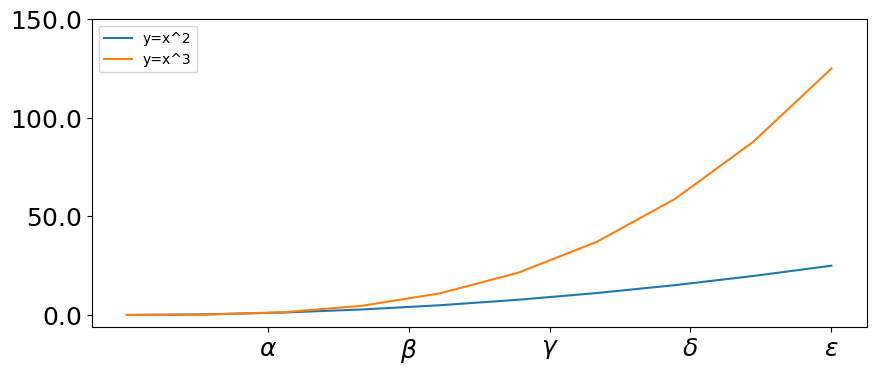

In [34]:
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(x, x**2, label="y=x^2") # задаём лэйбл графика
ax.plot(x, x**3, label="y=x^3") # задаём лэйбл графика

ax.set_xticks([1, 2, 3, 4, 5])
ax.set_xticklabels([r'$\alpha$', r'$\beta$', r'$\gamma$', r'$\delta$', r'$\epsilon$'], fontsize=18)

yticks = [0, 50, 100, 150]
ax.set_yticks(yticks)
ax.set_yticklabels(["$%.1f$" % y for y in yticks], fontsize=18) # use LaTeX formatted labels

ax.legend(loc=0) # отображаем легенду в оптимальном положении (параметр loc = 0)

__Задание 2__: Задайте график косинуса, область определения которого по оси x будет от -10 до 10. Нарисуйте его в декартовой системе координат. Для оси y укажите диапазон меньший, чем для области значения, для оси x укажите диапазон больший, чем для области определения. Найдите самостоятельно как сделать аннотацию для одной точки и сделайте это.

*Дополнительно*: Найдите самостоятельно, как сделать подпись для линии график (не в формате легенды), и сделайте это

In [25]:
# YOUR CODE HERE

## Другие графики

Помимо точечных и линейных графиков в Matplotlib есть множество других инструментов, таких как гистограммы, круговые диаграммы, графики в полярных координатах и так далее. С ними вы можете ознакомиться самостоятельно при выполнении домашнего задания. Вот пару примеров:

Text(0.5, 1.0, 'fill_between')

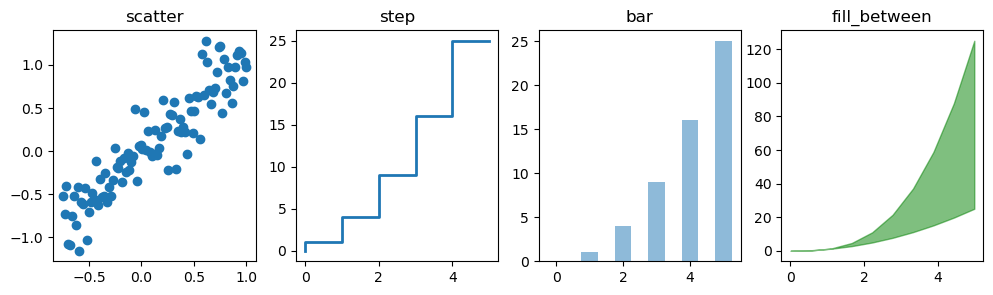

In [53]:
xx = np.linspace(-0.75, 1., 100)
n = np.array([0,1,2,3,4,5])

fig, axes = plt.subplots(1, 4, figsize=(12,3))

axes[0].scatter(xx, xx + 0.25*np.random.randn(len(xx)))
axes[0].set_title("scatter")

axes[1].step(n, n**2, lw=2)
axes[1].set_title("step")

axes[2].bar(n, n**2, align="center", width=0.5, alpha=0.5)
axes[2].set_title("bar")

axes[3].fill_between(x, x**2, x**3, color="green", alpha=0.5);
axes[3].set_title("fill_between")

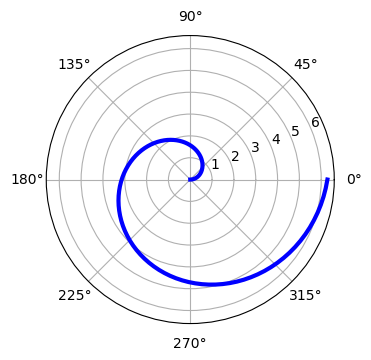

In [54]:
# график в полярных координатах
fig = plt.figure()
ax = fig.add_axes([0.0, 0.0, .6, .6], polar=True)
t = np.linspace(0, 2 * np.pi, 100)
ax.plot(t, t, color='blue', lw=3)

(-4.464203797581824, 4.7644404723985)

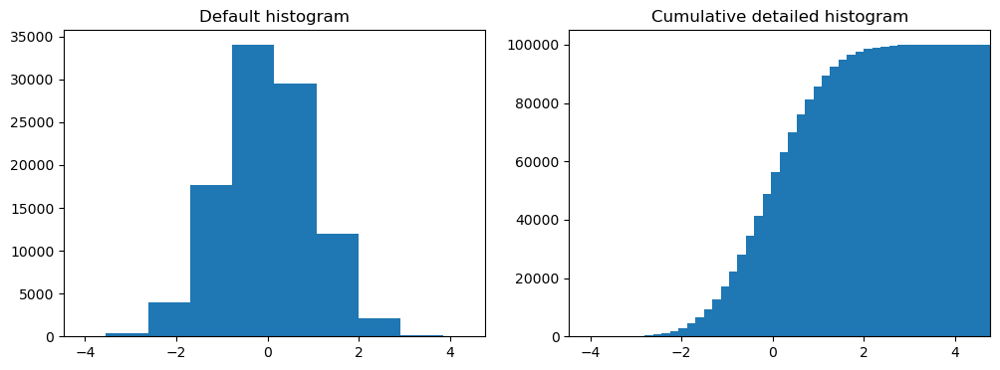

In [55]:
# гистограмма
n = np.random.randn(100000)
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].hist(n)
axes[0].set_title("Default histogram")
axes[0].set_xlim((min(n), max(n)))

axes[1].hist(n, cumulative=True, bins=50)
axes[1].set_title("Cumulative detailed histogram")
axes[1].set_xlim((min(n), max(n)))

## Plotly

TODO: 
- добавить описание графиков, что и зачем
- добавить раздел про работу с Dash

**Plotly** — это библиотека визуализации данных с открытым исходным кодом, предоставляющая широкий спектр возможностей интерактивного построения графиков на языке Python. Plotly позволяет создавать интерактивные визуализации, включая линейные графики, точечные диаграммы, гистограммы, тепловые карты, трехмерные графики и многое другое.

Краткий обзор библиотеки: https://blog.skillfactory.ru/vizualizatsiya-dannyh-v-python-s-pomoschyu-plotly.

Подробнее с функционалом можно ознакомиться на официальном сайте: https://plotly.com/python/

In [3]:
!pip install plotly 

  Obtaining dependency information for plotly from https://files.pythonhosted.org/packages/b3/f6/64fe388089588a0c364b03809443cd628fe0261d1364313fb7aec6bb0ebc/plotly-5.24.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.0 MB 151.3 kB/s eta 0:02:06
   ---------------------------------------- 0.0/19.0 MB 151.3 kB/s eta 0:02:06
   ---------------------------------------- 0.1/19.0 MB 196.9 kB/s eta 0:01:37
   ---------------------------------------- 0.1/19.0 MB 285.2 kB/s eta 0:01

После установки перезапустите Kernel

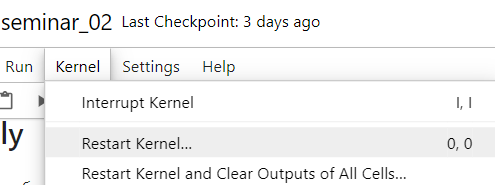

In [57]:
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

from plotly.subplots import make_subplots
from scipy.stats import multivariate_normal

### Точечные и линейные графики
Этот тип графика используется для визуализации отношения между переменными путем отображения точек на плоскости и соединения их линиями для линейного графика. 

Документация: https://plotly.com/python/line-and-scatter/

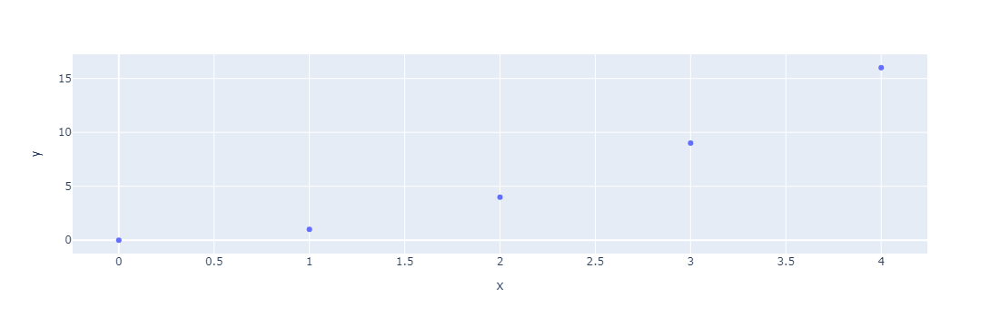

In [58]:
fig = px.scatter(x=[0, 1, 2, 3, 4], y=[0, 1, 4, 9, 16])
fig.show()

В библиотеке PLotly есть пакет [plotly.express.data](https://plotly.com/python-api-reference/generated/plotly.express.data.html) с набором датасетов. Датасеты храняться в формате pandas.DataFrame, о котором вы узнаете подробнее на следующем семинаре, пока вам нужно знать, что это как таблица из строк и столбцов.

In [59]:
df = px.data.iris() # iris is a pandas DataFrame
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


Ниже представлен точечный график. Для точек указаны свои размеры, поэтому его ещё называют пузырьковой диаграммой. В [px.scatter](https://plotly.com/python-api-reference/generated/plotly.express.scatter) есть много параметров, рассмотрим, что означает каждый из них и что добавляет.

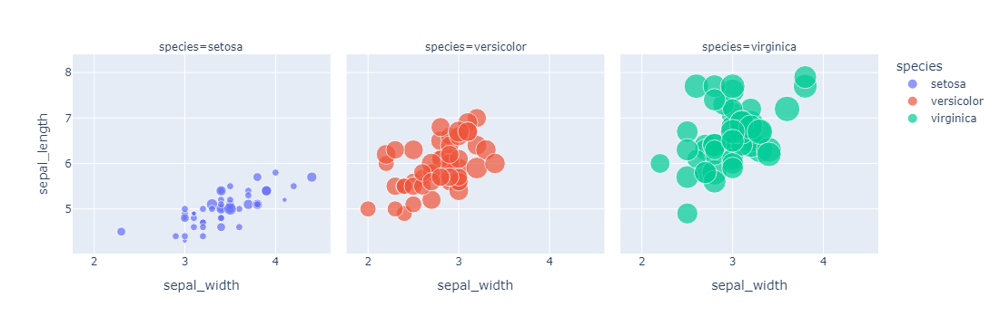

In [60]:
# добавляется разделение на подграфики автоматически при добавления параметра facet_col
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species",
                 size='petal_width', hover_data=['petal_width'], facet_col="species")
fig.show()

#### Trendlines для точечных графиков

Иногда для набора точек необходимо определить линию, которая показывает общую тенденцию. Такая линия называется trendlines, рассмотрим на примере датасета с информацией о стоимости акций.

Документация: https://plotly.com/python/linear-fits/

In [61]:
df = px.data.stocks(datetimes=True)
df.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


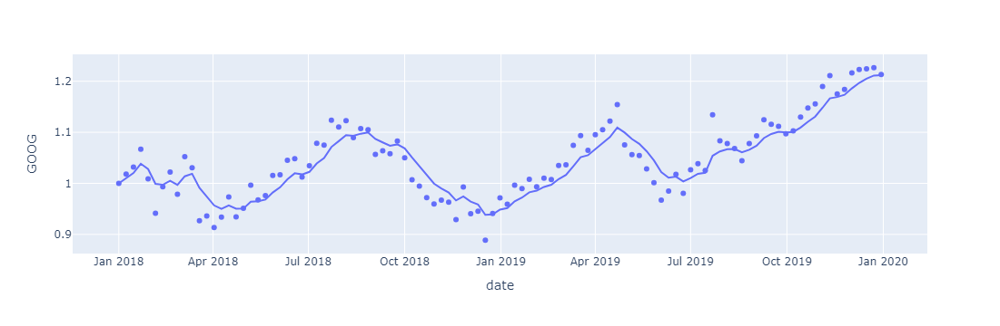

In [62]:
fig = px.scatter(df, x="date", y="GOOG", trendline="ewm", trendline_options=dict(halflife=2))
fig.show()

Рассмотрим, как по точкам можно построить линейный график, только не с помощью plotly.express, а с помощью Figure из plotly.graph_objects.

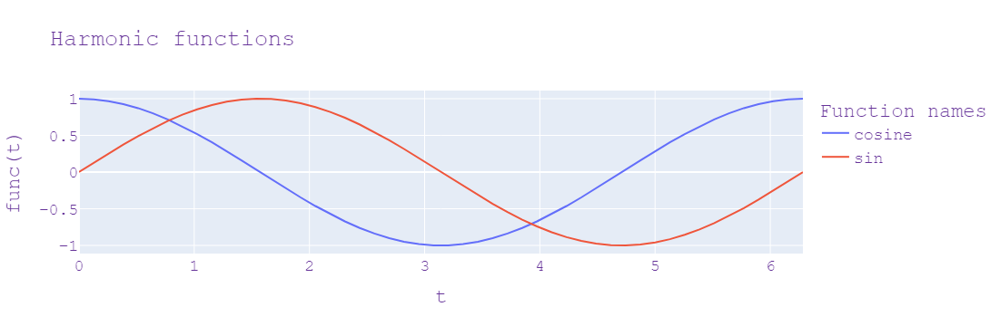

In [63]:
t = np.linspace(0, 2*np.pi, 50)

#один из способов рисовать один график вместе с другим
fig = go.Figure()

fig.add_trace(go.Scatter(x=t, y=np.cos(t),
                    mode='lines', name='cosine'))
fig.add_trace(go.Scatter(x=t, y=np.sin(t),
                    mode='lines', name='sin'))

# добавим информацию о графике
fig.update_layout(
    title="Harmonic functions",
    xaxis_title="t",
    yaxis_title="func(t)",
    legend_title="Function names",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    )
)
    
fig.show()

### Гистограммы

Рассмотрим, как можно строить гистограммы на основе DataFrame и какие параметры есть у метода [px.bar](https://plotly.github.io/plotly.py-docs/generated/plotly.express.bar.html)

Документация: https://plotly.com/python/bar-charts/

In [64]:
df = px.data.gapminder().query("country == ['Canada', 'France']")
df.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
240,Canada,Americas,1952,68.75,14785584,11367.16112,CAN,124
241,Canada,Americas,1957,69.96,17010154,12489.95006,CAN,124
242,Canada,Americas,1962,71.30,18985849,13462.48555,CAN,124
243,Canada,Americas,1967,72.13,20819767,16076.58803,CAN,124
244,Canada,Americas,1972,72.88,22284500,18970.57086,CAN,124


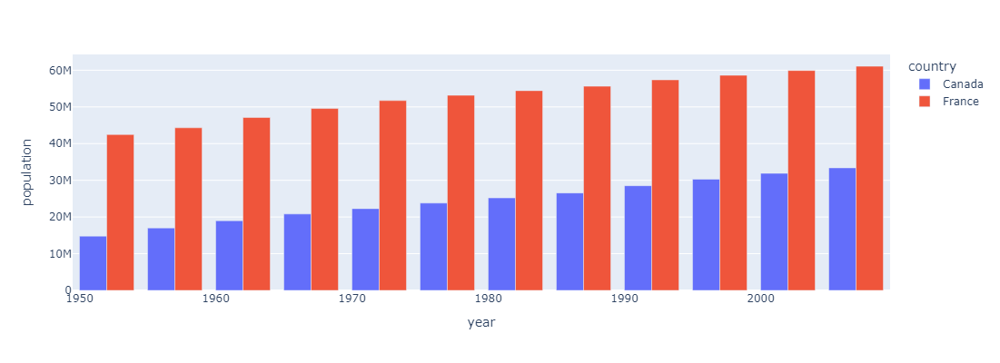

In [65]:
fig = px.bar(df, x='year', y='pop', color='country',
             labels={'pop':'population'}, height=400, barmode='group')
fig.show()

### Круговые диаграммы

На примере круговых диаграмм рассмотрим ещё один способ отображения нескольких графиков рядом с помощью [make_subplots](https://plotly.com/python-api-reference/generated/plotly.subplots.make_subplots.html). Этот способ похож на создание нескольких графиков в Matplotlib.

Документация: https://plotly.com/python/pie-charts/

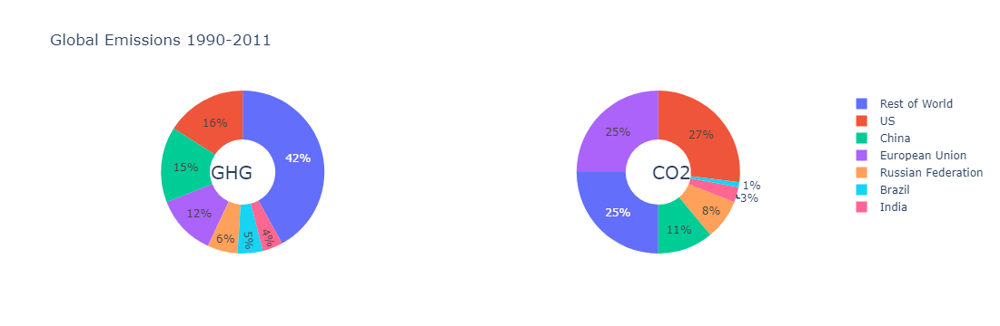

In [66]:
labels = ["US", "China", "European Union", "Russian Federation", "Brazil", "India",
          "Rest of World"]

#ещё один способ создания двух графиков рядом
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=[16, 15, 12, 6, 5, 4, 42], name="GHG Emissions"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=[27, 11, 25, 8, 1, 3, 25], name="CO2 Emissions"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")
fig.update_layout(
    title_text="Global Emissions 1990-2011",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='GHG', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='CO2', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()

### 3D графики

И в Matplotlib, и в Plotly есть инструменты для построения 3D графиков. Рассмторим только один из способов и построим колокол двумерного нормального распределения.

Документация: https://plotly.com/python/3d-surface-plots/

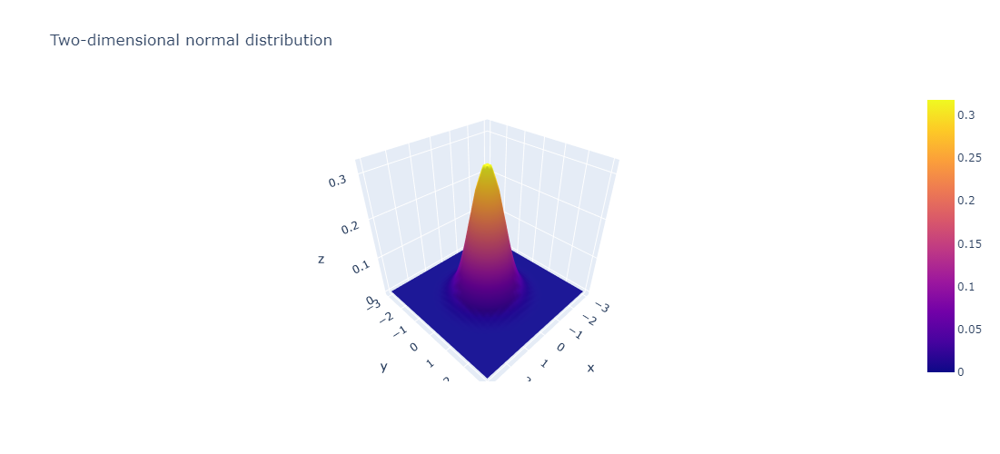

In [67]:
x, y = np.mgrid[-3.0:3.0:30j, -3.0:3.0:30j]

# Need an (N, 2) array of (x, y) pairs.
xy = np.column_stack([x.flat, y.flat])

mu = np.array([0.0, 0.0])

sigma = np.array([.7, .7])
covariance = np.diag(sigma**2)

z = multivariate_normal.pdf(xy, mean=mu, cov=covariance)

# Reshape back to a (30, 30) grid.
z = z.reshape(x.shape)

fig = go.Figure()
fig.add_trace(go.Surface(x=x, y=y, z=z))
fig.update_layout(title_text="Two-dimensional normal distribution", 
                  width=500, 
                  height=500)

Вы можете строить любые поверхности, которые можно задать уравнением, и придавать им окраску в зависимости от изменения того или иного параметра.

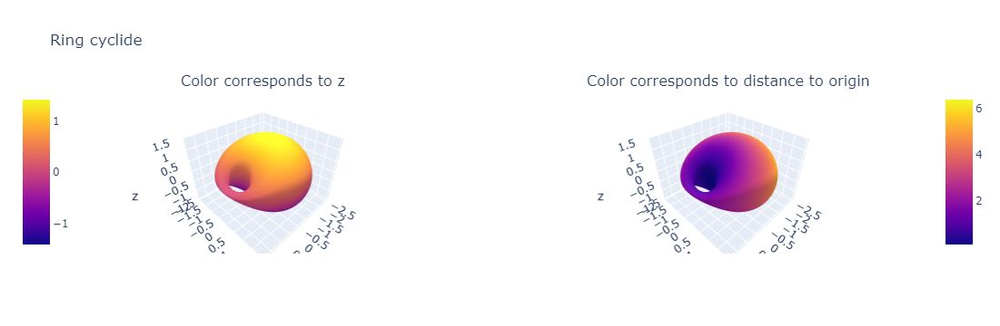

In [68]:
# Equation of ring cyclide
# see https://en.wikipedia.org/wiki/Dupin_cyclide
a, b, d = 1.32, 1., 0.8
c = a**2 - b**2
u, v = np.mgrid[0:2*np.pi:100j, 0:2*np.pi:100j]
x = (d * (c - a * np.cos(u) * np.cos(v)) + b**2 * np.cos(u)) / (a - c * np.cos(u) * np.cos(v))
y = b * np.sin(u) * (a - d*np.cos(v)) / (a - c * np.cos(u) * np.cos(v))
z = b * np.sin(v) * (c*np.cos(u) - d) / (a - c * np.cos(u) * np.cos(v))

fig = make_subplots(rows=1, cols=2,
                    specs=[[{'is_3d': True}, {'is_3d': True}]],
                    subplot_titles=['Color corresponds to z', 'Color corresponds to distance to origin'],
                    )

fig.add_trace(go.Surface(x=x, y=y, z=z, colorbar_x=-0.07), 1, 1)
fig.add_trace(go.Surface(x=x, y=y, z=z, surfacecolor=x**2 + y**2 + z**2), 1, 2)
fig.update_layout(title_text="Ring cyclide")
fig.show()

### Статистические графики

Для того, чтобы проводить анализ данных, иногда необходимо строить распределения величин, а также смотреть взаимное расположения распределений. Это можно делать с помощью библиотеки Plotly.

Документация: https://plotly.com/python/statistical-charts/

#### График кумулятивного распределения

Эмпирические графики функции кумулятивного распределения - это способ визуализации распределения переменной, и в Plotly Express есть встроенная функция [px.ecdf](https://plotly.com/python-api-reference/generated/plotly.express.ecdf.html) для создания таких графиков.

Документация: https://plotly.com/python/ecdf-plots/

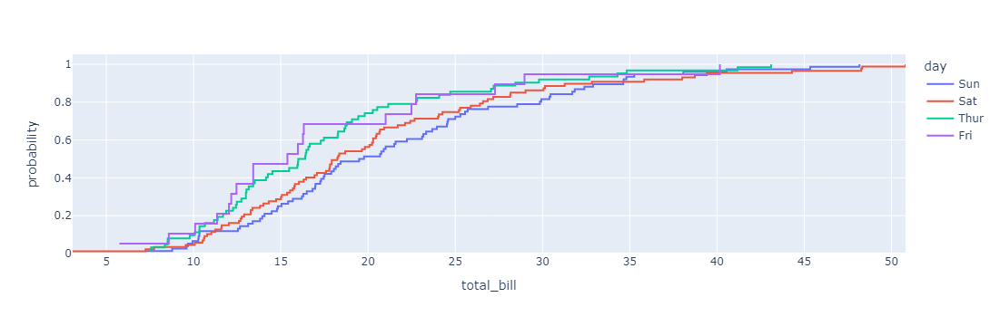

In [69]:
df = px.data.tips()
fig = px.ecdf(df, x="total_bill", color="day")
fig.show()

#### Boxplot

Boxplot - это статистическое представление распределения переменной по ее квартилям. Края прямоугольника представляют нижний и верхний квартили, а медиана (второй квартиль) отмечена линией внутри прямоугольника. 

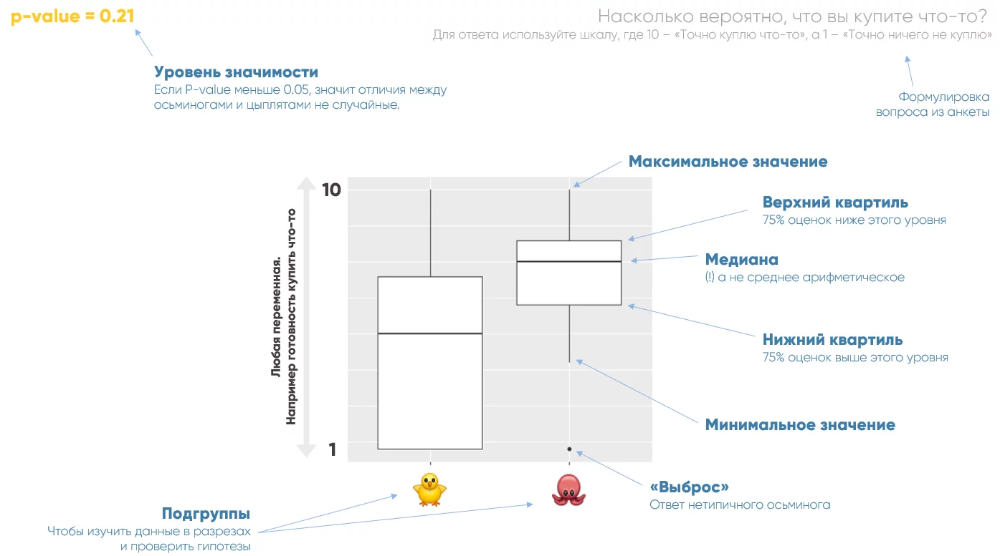

Подробнее про boxplot: https://tidydata.ru/boxplot

Документация: https://plotly.com/python/box-plots/

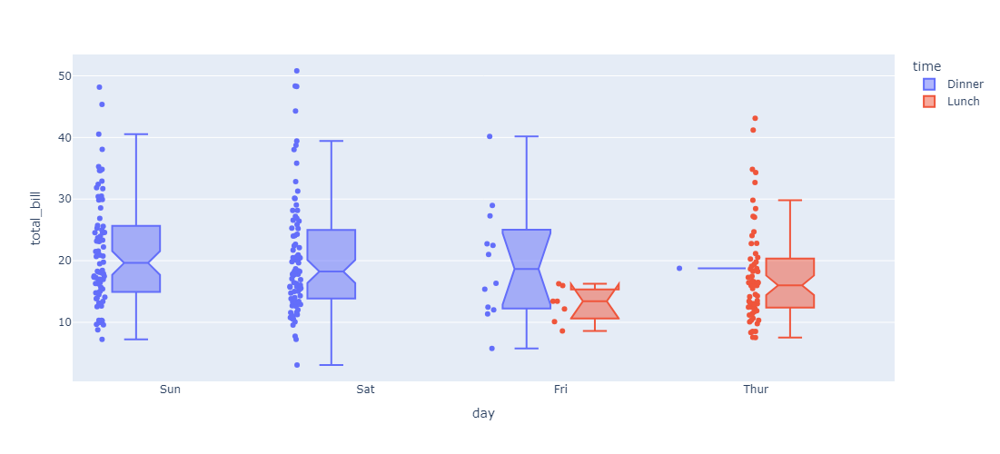

In [70]:
df = px.data.tips()
fig = px.box(df, x="day", y="total_bill", points="all", color = "time", notched=True)
fig.update_layout(width=1100, 
                  height=500)
fig.show()

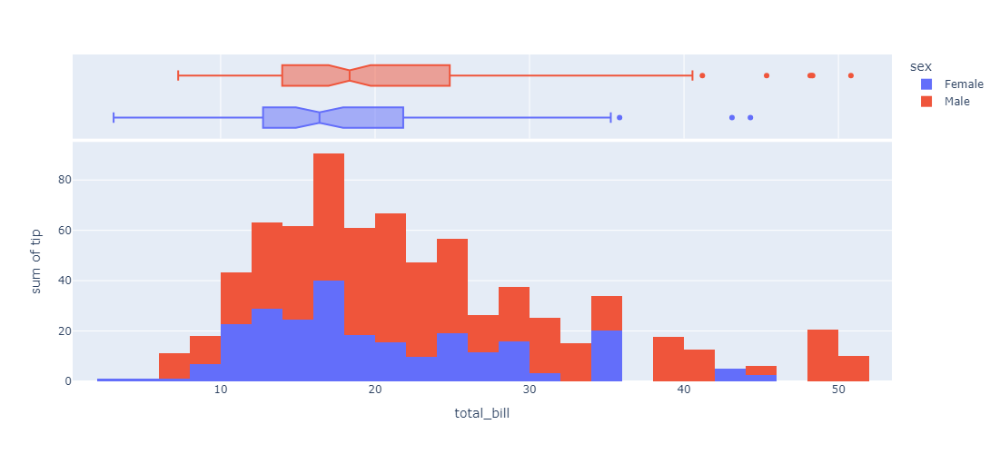

In [71]:
# можно отображать boxplot совместно с гистограммами
fig = px.histogram(df, x="total_bill", y="tip", color="sex",
                   marginal="box",
                   hover_data=df.columns)
fig.update_layout(height=500)
fig.show()

#### Распределения

[figure_factory.create_distplot](https://plotly.github.io/plotly.py-docs/generated/plotly.figure_factory.create_distplot.html) отображает комбинацию статистических представлений числовых данных, таких как гистограмма, оценка плотности ядра или нормальная кривая, а также график rug.

Документация: https://plotly.com/python/distplot/

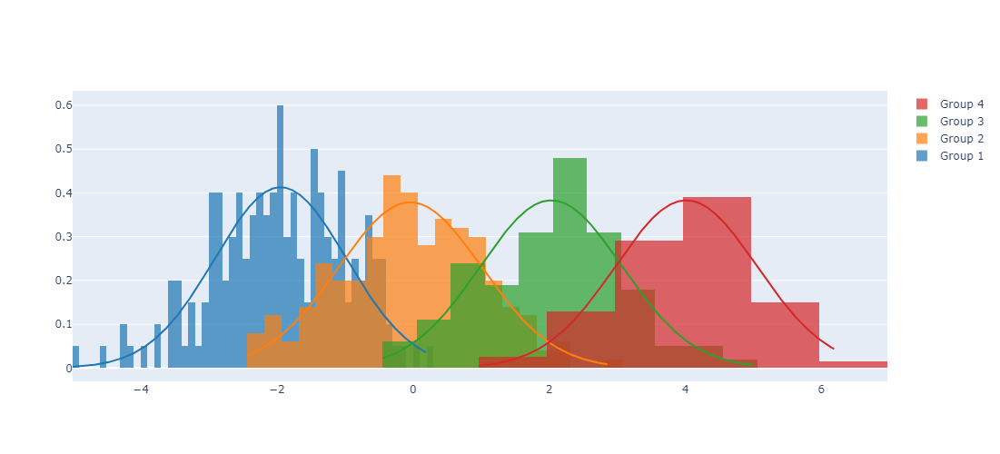

In [72]:
# Add histogram data
x1 = np.random.randn(200) - 2
x2 = np.random.randn(200)
x3 = np.random.randn(200) + 2
x4 = np.random.randn(200) + 4

# Group data together
hist_data = [x1, x2, x3, x4]

group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels,
                        bin_size=[.1, .25, .5, 1], 
                        curve_type="normal", #default "kde"
                        show_curve=True,
                        show_hist=True,
                        show_rug=False)
fig.update_layout(height=500)
fig.show()

### Работа с картами
Хороплетная карта - это карта, состоящая из цветных полигонов. Она используется для представления пространственных изменений величины.

Ниже мы покажем, как создавать карты Choropleth, используя либо функцию px.choropleth_map в Plotly Expre.pleth
Для создания карт choropleth требуются два основных типа входных дан- ых:

Геометрическая информация в формате GeoJSON, где каждый объект имеет либо поле идентификатора, либо некоторое идентифицирующее значение в свой- ствах.
Список значений, проиндексированных по идентификатору о
бъекта.
Данные GeoJSON передаются в аргумент geojson, а данные передаются в аргумент color в px.choro_objects), в том же порядке, в каком идентификаторы передаются в аргумент location.

Обратите внимание, что атрибут geojson также может быть URL-адресом файла GeoJSON, что в определенных случаях может ускорить рендериДокументация: нг карты.

https://plotly.com/python/tile-county-choropleth/

In [73]:
df = px.data.election()
geojson = px.data.election_geojson()

In [74]:
df.head()
# geojson

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
0,101-Bois-de-Liesse,2481,1829,3024,7334,Joly,plurality,101
1,102-Cap-Saint-Jacques,2525,1163,2675,6363,Joly,plurality,102
2,11-Sault-au-Récollet,3348,2770,2532,8650,Coderre,plurality,11
3,111-Mile-End,1734,4782,2514,9030,Bergeron,majority,111
4,112-DeLorimier,1770,5933,3044,10747,Bergeron,majority,112


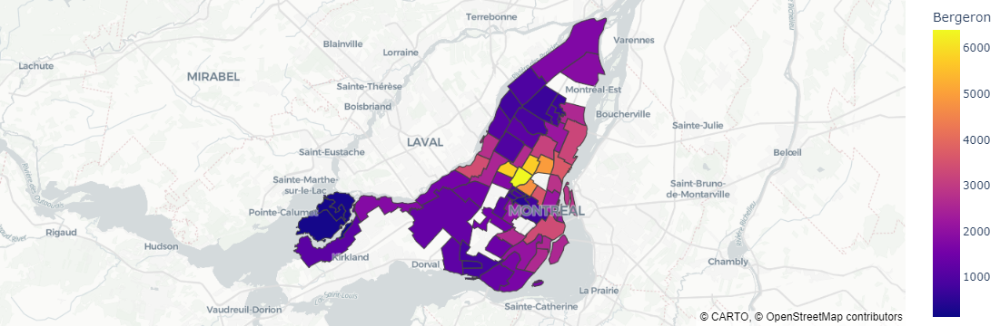

In [76]:
fig = px.choropleth_map(df, geojson=geojson, color="Bergeron",
                           locations="district", featureidkey="properties.district",
                           center={"lat": 45.5517, "lon": -73.7073},
                           map_style="carto-positron", zoom=9)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Работа с дэшбордами в Dash с графиками Plotly

В Plotly есть возможность создавать дэшборды с помощью платформы Dash. Подробнее с созданием дэшбордов можете ознакомиться по этой [ссылке](https://dash.plotly.com/tutorial), а также практически в каждой документации есть раздел по тому, как отобразить график с помощью Dash.

## Matplotlib или Plotly?

Обе библиотеки предлагают мощные возможности для создания графиков и диаграмм, но у них есть явные различия, которые делают их подходящими для разных случаев.

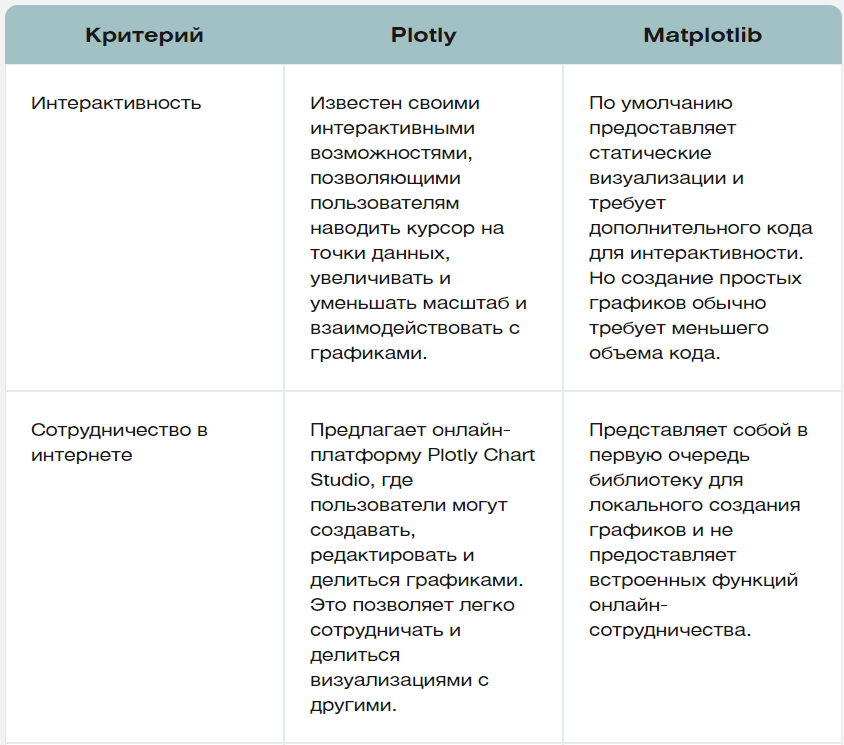
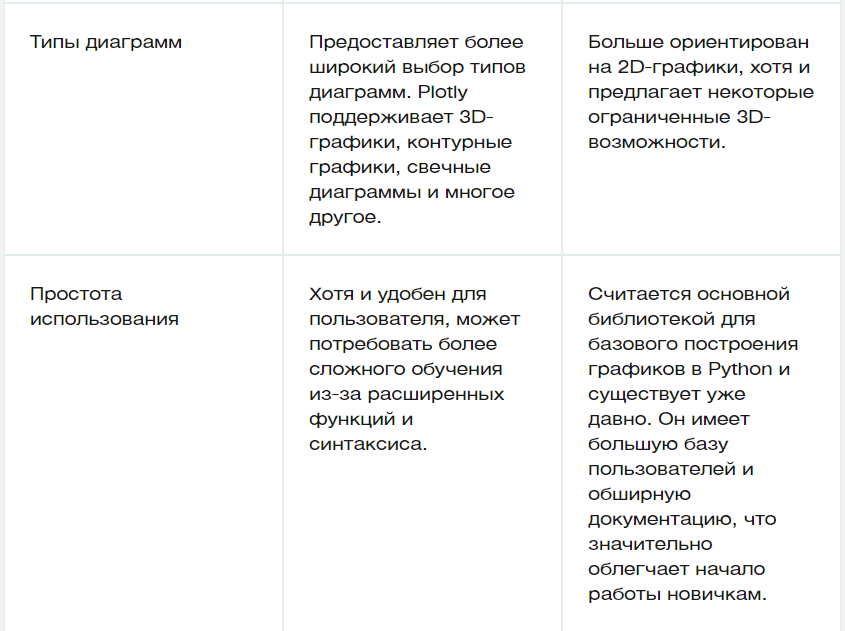